In [23]:
import pandas as pd

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
import dateutil
import datetime
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import numpy as np

from geopy.distance import geodesic
import folium

In [2]:
spray = pd.read_csv('./database/spray.csv')
spray['Date'] = pd.to_datetime(spray['Date'])
spray.set_index('Date', inplace=True)

In [3]:
train = pd.read_csv('./database/train.csv')
train['Date'] = pd.to_datetime(train['Date'])
train.set_index('Date', inplace=True)

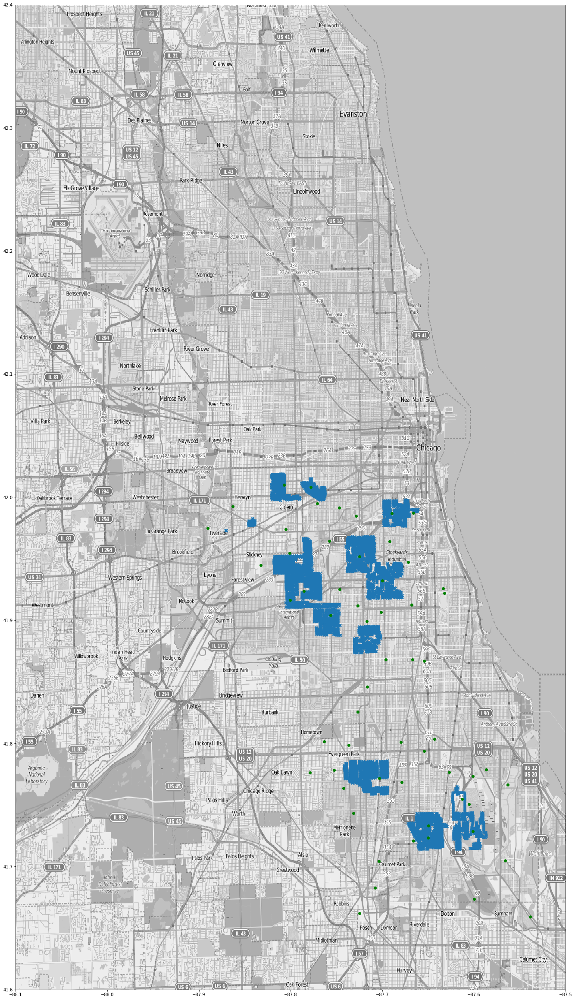

In [4]:
mapdata = np.loadtxt('./database/mapdata_copyright_openstreetmap_contributors.txt')
aspect = mapdata.shape[0] * 1.0/mapdata.shape[1]
long_lat_box = (-88.1, -87.5, 41.6, 42.4)
plt.figure(figsize=(30, 42))
plt.imshow(mapdata, cmap=plt.get_cmap('gray'), extent=long_lat_box, aspect=aspect)
locations = spray['2013'][['Longitude', 'Latitude']].drop_duplicates().values
wnv_locations = train['2013'][train['2013']['WnvPresent'] ==1][['Longitude', 'Latitude']].drop_duplicates().values

plt.scatter(locations[:,0], locations[:,1], marker='x')
plt.scatter(wnv_locations[:,0], wnv_locations[:,1], marker='o', c='g')

In [143]:
spray['Date'].value_counts().sort_index()

2011-08-29      95
2011-09-07    2114
2013-07-17    2202
2013-07-25    1607
2013-08-08    1195
2013-08-15    2668
2013-08-16     141
2013-08-22    1587
2013-08-29    2302
2013-09-05     924
Name: Date, dtype: int64

In [3]:
weather = pd.read_csv('./database/weather.csv')
weather.head()

,Station,Date,Tmax,Tmin,Tavg,Depart,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,CodeSum,Depth,Water1,SnowFall,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
0,1,2007-05-01,83,50,67,14,51,56,0,2,0448,1849,,0,M,0.0,0.00,29.10,29.82,1.7,27,9.2
1,2,2007-05-01,84,52,68,M,51,57,0,3,-,-,,M,M,M,0.00,29.18,29.82,2.7,25,9.6
2,1,2007-05-02,59,42,51,-3,42,47,14,0,0447,1850,BR,0,M,0.0,0.00,29.38,30.09,13.0,4,13.4
3,2,2007-05-02,60,43,52,M,42,47,13,0,-,-,BR HZ,M,M,M,0.00,29.44,30.08,13.3,2,13.4
4,1,2007-05-03,66,46,56,2,40,48,9,0,0446,1851,,0,M,0.0,0.00,29.39,30.12,11.7,7,11.9


- # Vector Index Creation EDA

In [50]:
#new df to parse the date
new_train = pd.read_csv('./database/train.csv')
new_train['month'] = new_train['Date'].apply(lambda a: datetime.datetime.strptime(a, "%Y-%m-%d").month)
new_train['year'] = new_train['Date'].apply(lambda a: datetime.datetime.strptime(a, "%Y-%m-%d").year)
new_train['week'] = new_train['Date'].apply(lambda a: datetime.datetime.strptime(a, "%Y-%m-%d").strftime("%U"))

In [14]:
group = new_train.groupby(['Block','year', 'month','week']).sum().reset_index()

In [15]:
group_sum_mosquitos_wk = group[['Block', 'year', 'month','week', 'NumMosquitos']]

/Users/jonzhao/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


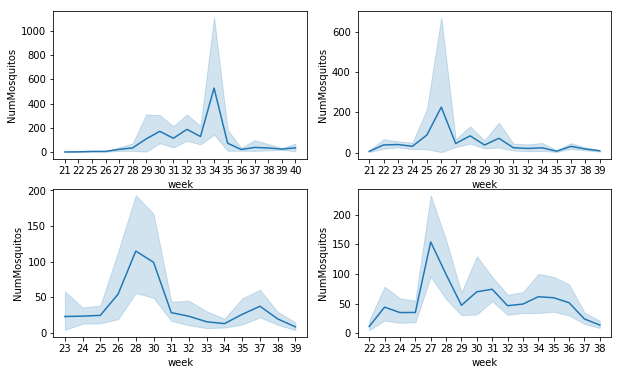

In [18]:
#2007 number of mosquitos by wk
f,ax = plt.subplots(nrows=2, ncols=2, figsize=(10,6))
sns.lineplot(x=group_sum_mosquitos_wk[group_sum_mosquitos_wk['year'] == 2007]['week'],
             y=group_sum_mosquitos_wk[group_sum_mosquitos_wk['year'] == 2007]['NumMosquitos'],
             ax=ax[0,0]);
#2009 number of mosquitos by wk
sns.lineplot(x='week',
             y='NumMosquitos',
             data = group_sum_mosquitos_wk[group_sum_mosquitos_wk['year'] == 2009],
            ax=ax[0,1]);
#2011 number of mosquitos by wk
sns.lineplot(x='week',
             y='NumMosquitos',
             data = group_sum_mosquitos_wk[group_sum_mosquitos_wk['year'] == 2011],
            ax=ax[1,0]);
#2013 number of mosquitos by wk
sns.lineplot(x='week',
             y='NumMosquitos',
             data = group_sum_mosquitos_wk[group_sum_mosquitos_wk['year'] == 2013],
            ax=ax[1,1]);

In [19]:
#mean number of mosquitos by blocks
block_mean = group.groupby('Block').mean()

In [153]:
#number of block
len(block_mean.index)

64

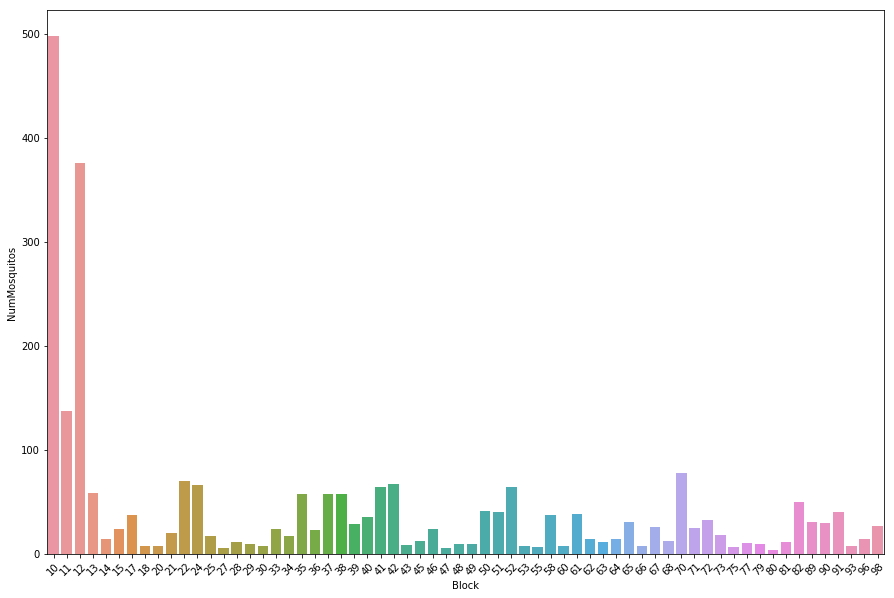

In [156]:
plt.figure(figsize=(15,10))
sns.barplot(x=block_mean.index,
           y=block_mean['NumMosquitos'])
plt.xticks(rotation=45);

In [23]:
#number of traps per year
group.year.value_counts()

2007    751
2013    650
2009    533
2011    494
Name: year, dtype: int64

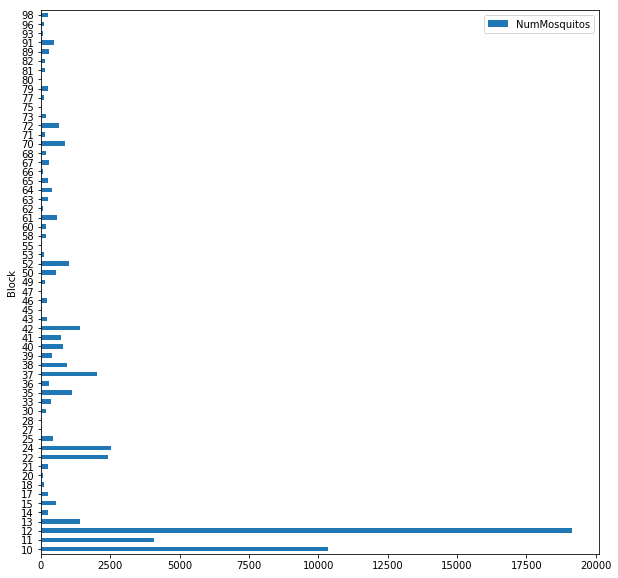

In [148]:
#number of mosquitos in 2007
group[group['year'] == 2007][['Block','NumMosquitos']].groupby('Block').sum().plot(kind='barh', figsize=(10,10))

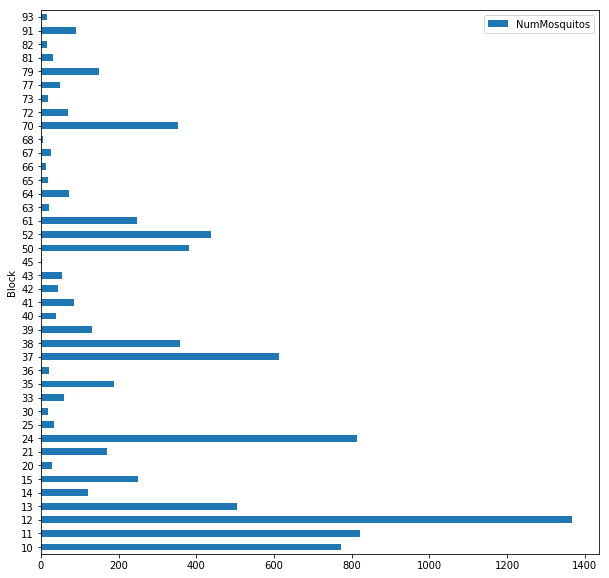

In [76]:
#number of mosquitos in infected areas in 2007
infected_group = group[group['WnvPresent'] == 1]
infected_group[infected_group['year'] == 2007][['Block','NumMosquitos']].groupby('Block').sum().plot(kind='barh', figsize=(10,10))

In [160]:
#species captured in total
new_train['Species'].value_counts()

CULEX PIPIENS/RESTUANS    4752
CULEX RESTUANS            2740
CULEX PIPIENS             2699
CULEX TERRITANS            222
CULEX SALINARIUS            86
CULEX TARSALIS               6
CULEX ERRATICUS              1
Name: Species, dtype: int64

In [84]:
#number of species in infected areas
new_train[new_train['WnvPresent'] == 1]['Species'].value_counts()

CULEX PIPIENS/RESTUANS    262
CULEX PIPIENS             240
CULEX RESTUANS             49
Name: Species, dtype: int64

- # Find the boundary of blocks

Conclusion: we may need to find out our own way to create blocks, couldn't figure out how the blocks in the datasets based on. 

In [102]:
#number of blocks
len(new_train['Block'].value_counts().index)

64

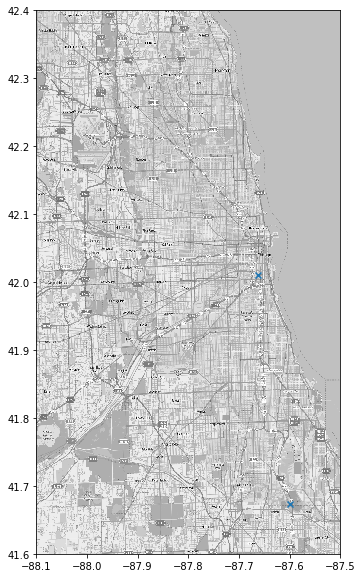

In [120]:
mapdata = np.loadtxt('./database/mapdata_copyright_openstreetmap_contributors.txt')
aspect = mapdata.shape[0] * 1.0/mapdata.shape[1]
long_lat_box = (-88.1, -87.5, 41.6, 42.4)
plt.figure(figsize=(15, 10))
plt.imshow(mapdata, cmap=plt.get_cmap('gray'), extent=long_lat_box, aspect=aspect)
locations = new_train[new_train['Block'] == 12][['Longitude','Latitude']].drop_duplicates().values

plt.scatter(locations[:,0], locations[:,1], marker='x')

In [119]:
new_train[new_train['Block'] == 12][['Longitude','Latitude']].drop_duplicates()

,Longitude,Latitude
194,-87.662140,42.010412
529,-87.599862,41.673408


In [205]:
new_train[new_train['Block'] == 72][['Longitude','Latitude']].drop_duplicates()

,Longitude,Latitude
52,-87.811506,42.011601


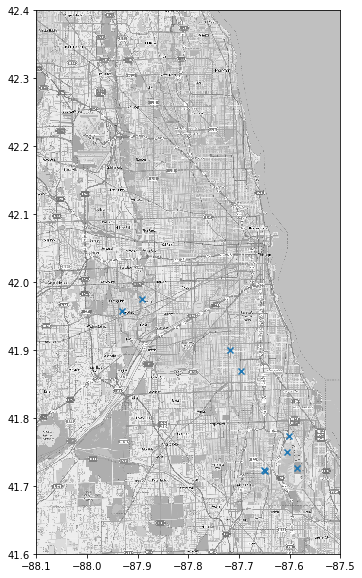

In [121]:
mapdata = np.loadtxt('./database/mapdata_copyright_openstreetmap_contributors.txt')
aspect = mapdata.shape[0] * 1.0/mapdata.shape[1]
long_lat_box = (-88.1, -87.5, 41.6, 42.4)
plt.figure(figsize=(15, 10))
plt.imshow(mapdata, cmap=plt.get_cmap('gray'), extent=long_lat_box, aspect=aspect)
locations = new_train[new_train['Block'] == 10][['Longitude','Latitude']].drop_duplicates().values

plt.scatter(locations[:,0], locations[:,1], marker='x')

- # Efficiency of spray

In [30]:
spray =pd.read_csv('./database/spray.csv')
spray.head()

,Date,Time,Latitude,Longitude
0,2011-08-29,6:56:58 PM,42.391623,-88.089163
1,2011-08-29,6:57:08 PM,42.391348,-88.089163
2,2011-08-29,6:57:18 PM,42.391022,-88.089157
3,2011-08-29,6:57:28 PM,42.390637,-88.089158
4,2011-08-29,6:57:38 PM,42.390410,-88.088858


In [150]:
#total traps in Chicago
len(new_train[['Block', 'Latitude', 'Longitude']].drop_duplicates())

138

In [51]:
#trap locations
trap_location = new_train[['Block', 'Latitude', 'Longitude']].drop_duplicates()
trap_location.reset_index(drop=True, inplace=True)
trap_location.head()

,Block,Latitude,Longitude
0,41,41.954690,-87.800991
1,62,41.994991,-87.769279
2,79,41.974089,-87.824812
3,15,41.921600,-87.666455
4,25,41.891118,-87.654491


In [207]:
#add nearest trap location in order to mearsure the efficiency
nearest_trap = []
nearest_trap_lat = []
nearest_trap_long = []

for i in range(len(spray)):
    
    distance = []
    
    for j in range(len(trap_location)):
#         distance['trap'] = trap_location.loc[j, 'Block']
        dist = geodesic((spray.loc[i, 'Latitude'],spray.loc[i, 'Longitude']), 
                 (trap_location.loc[j,'Latitude'], trap_location.loc[j,'Longitude'])).miles
        distance.append(dist)
        
    min_trap = distance.index(min(distance))
    nearest_trap.append(trap_location.loc[min_trap, 'Block'])
    nearest_trap_lat.append(trap_location.loc[min_trap, 'Latitude'])
    nearest_trap_long.append(trap_location.loc[min_trap, 'Longitude'])

In [215]:
#add nearest trap location in spray df
spray['nearest_trap'] = nearest_trap
spray['nearest_trap_lat'] = nearest_trap_lat
spray['nearest_trap_long'] = nearest_trap_long

In [239]:
#add distance in spray df
spray['distance'] = [geodesic((spray.loc[i, 'Latitude'],spray.loc[i, 'Longitude']), 
                             (spray.loc[j,'nearest_trap_lat'], spray.loc[j,'nearest_trap_long'])).miles for i in spray.index]

In [325]:
# spray.to_csv('spray_add_nearest_trap.csv')
spray = pd.read_csv('./spray_add_nearest_trap.csv', index_col=0)

In [326]:
#the farest distance between sprayed location to the nearest trap
spray.sort_values(by='distance', ascending=False).head()

,Date,Time,Latitude,Longitude,nearest_trap,nearest_trap_lat,nearest_trap_long,distance
40,2011-08-29,7:04:18 PM,42.395983,-88.095757,72,42.011601,-87.811506,33.361999
39,2011-08-29,7:04:08 PM,42.395697,-88.095833,72,42.011601,-87.811506,33.346455
38,2011-08-29,7:03:58 PM,42.395352,-88.095772,72,42.011601,-87.811506,33.324007
41,2011-08-29,7:04:48 PM,42.395218,-88.095685,72,42.011601,-87.811506,33.313803
37,2011-08-29,7:03:48 PM,42.395078,-88.095520,72,42.011601,-87.811506,33.301287


In [327]:
#the closest distance between sprayed location to the nearest trap
spray.sort_values(by='distance', ascending=False).tail()

,Date,Time,Latitude,Longitude,nearest_trap,nearest_trap_lat,nearest_trap_long,distance
125,2011-09-07,7:59:52 PM,41.970253,-87.789247,64,41.970248,-87.787992,0.064623
117,2011-09-07,7:57:42 PM,41.969340,-87.787978,64,41.970248,-87.787992,0.062672
114,2011-09-07,7:57:12 PM,41.970898,-87.787920,64,41.970248,-87.787992,0.045037
116,2011-09-07,7:57:32 PM,41.969870,-87.787962,64,41.970248,-87.787992,0.026135
115,2011-09-07,7:57:22 PM,41.970400,-87.787947,64,41.970248,-87.787992,0.010747


In [328]:
sprayed_area = spray[['Date', 'nearest_trap', 'nearest_trap_lat', 'nearest_trap_long']].drop_duplicates()
sprayed_area['Date'] = pd.to_datetime(sprayed_area['Date'])
sprayed_area.set_index('Date', inplace=True)

In [345]:
sprayed_area['2013-08']['nearest_trap'].value_counts()

21    3
10    3
60    3
15    3
17    2
33    2
40    2
52    2
58    2
68    1
18    1
70    1
67    1
13    1
66    1
65    1
61    1
93    1
81    1
28    1
34    1
35    1
36    1
38    1
41    1
77    1
79    1
51    1
64    1
Name: nearest_trap, dtype: int64

In [352]:
sprayed_area['2013-08'][sprayed_area['2013-08']['nearest_trap'] == 21]

,nearest_trap,nearest_trap_lat,nearest_trap_long
Date,,,
2013-08-08,21,41.919343,-87.694259
2013-08-15,21,41.918705,-87.752329
2013-08-16,21,41.918705,-87.752329


In [333]:
train['2013-08'].index.value_counts()

2013-08-01    186
2013-08-08    181
2013-08-22    167
2013-08-15    157
2013-08-29    143
Name: Date, dtype: int64

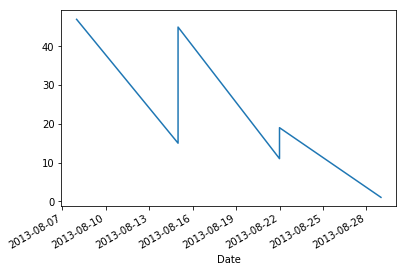

In [353]:
train['2013-08'][train['2013-08']['Block'] == 21]['NumMosquitos'].plot(kind='line')

- # Outside Database

In [355]:
data = pd.read_csv('./database/West_Nile_Virus__WNV__Mosquito_Test_Results.csv')

In [356]:
data.head()

,SEASON YEAR,WEEK,TEST ID,BLOCK,TRAP,TRAP_TYPE,TEST DATE,NUMBER OF MOSQUITOES,RESULT,SPECIES,LATITUDE,LONGITUDE,LOCATION
0,2011,29,31550,100XX W OHARE AIRPORT,T916,GRAVID,07/25/2011 12:07:00 AM,3,negative,CULEX PIPIENS,NaN,NaN,NaN
1,2016,25,42613,58XX N PULASKI RD,T027,GRAVID,06/22/2016 12:06:00 AM,6,negative,CULEX RESTUANS,41.986320,-87.728378,"(41.986319851449004, -87.72837845617912)"
2,2007,27,20583,15XX W WEBSTER AVE,T045,GRAVID,07/11/2007 03:07:41 AM,4,negative,CULEX PIPIENS/RESTUANS,41.921705,-87.666963,"(41.92170457422864, -87.66696323469388)"
3,2009,38,28275,5XX S CENTRAL AVE,T031,GRAVID,09/25/2009 12:09:00 AM,4,negative,CULEX PIPIENS,41.872873,-87.764737,"(41.87287286249572, -87.7647365320396)"
4,2011,34,32254,58XX N PULASKI RD,T027,GRAVID,08/26/2011 12:08:00 AM,2,negative,CULEX RESTUANS,41.986320,-87.728378,"(41.986319851449004, -87.72837845617912)"


In [361]:
data.columns

Index(['SEASON YEAR', 'WEEK', 'TEST ID', 'BLOCK', 'TRAP', 'TRAP_TYPE', 'TEST DATE', 'NUMBER OF MOSQUITOES', 'RESULT', 'SPECIES', 'LATITUDE', 'LONGITUDE', 'LOCATION'], dtype='object')

/Users/jonzhao/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


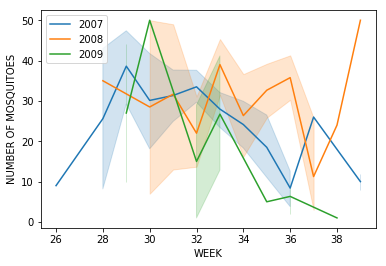

In [397]:
#number of mosquitos
sns.lineplot(x=data[(data['SEASON YEAR'] == 2007) & (data['RESULT'] == 'positive')]['WEEK'],
             y=data[(data['SEASON YEAR'] == 2007) & (data['RESULT'] == 'positive')]['NUMBER OF MOSQUITOES'])
sns.lineplot(x=data[(data['SEASON YEAR'] == 2008) & (data['RESULT'] == 'positive')]['WEEK'],
             y=data[(data['SEASON YEAR'] == 2008) & (data['RESULT'] == 'positive')]['NUMBER OF MOSQUITOES'])
sns.lineplot(x=data[(data['SEASON YEAR'] == 2009) & (data['RESULT'] == 'positive')]['WEEK'],
             y=data[(data['SEASON YEAR'] == 2009) & (data['RESULT'] == 'positive')]['NUMBER OF MOSQUITOES'])
plt.legend(['2007','2008','2009'])

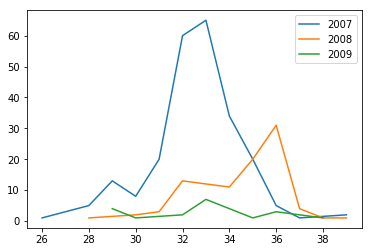

In [400]:
#number of positive cases
sns.lineplot(x=data[(data['SEASON YEAR'] == 2007) & (data['RESULT'] == 'positive')]['WEEK'].value_counts().keys(),
            y=data[(data['SEASON YEAR'] == 2007) & (data['RESULT'] == 'positive')]['WEEK'].value_counts().values)
sns.lineplot(x=data[(data['SEASON YEAR'] == 2008) & (data['RESULT'] == 'positive')]['WEEK'].value_counts().keys(),
            y=data[(data['SEASON YEAR'] == 2008) & (data['RESULT'] == 'positive')]['WEEK'].value_counts().values)
sns.lineplot(x=data[(data['SEASON YEAR'] == 2009) & (data['RESULT'] == 'positive')]['WEEK'].value_counts().keys(),
            y=data[(data['SEASON YEAR'] == 2009) & (data['RESULT'] == 'positive')]['WEEK'].value_counts().values)
plt.legend(['2007','2008','2009'])

- # Combine test and train

In [3]:
train = pd.read_csv('./database/train.csv')
test = pd.read_csv('./database/test.csv')

In [11]:
train.head(2)

,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent
0,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9,1,0
1,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9,1,0


In [9]:
test.drop('Id', axis=1,inplace=True)

In [14]:
train.drop('WnvPresent', axis=1, inplace=True)

In [17]:
train.drop('NumMosquitos', axis=1, inplace=True)

In [18]:
train.head(2)

,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy
0,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9
1,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9


In [19]:
test.head(2)

,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy
0,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9
1,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.95469,-87.800991,9


In [21]:
comb = pd.concat([train, test])

In [22]:
comb.to_csv('comb.csv')

- # Try map

In [ ]:
-88.1, -87.5, 41.6, 42.4

In [102]:
map = folium.Map(location=[41.8781, -87.6298], zoom_start=10)


In [103]:
#plot spray locations
for each in spray.iterrows():
    folium.Circle(color='crimson',radius=5,
                  location = [each[1]['Latitude'],each[1]['Longitude']],fill = False).add_to(map)



#plot Trap location
for each in trap_location.iterrows():
    folium.Circle(color='blue',radius=1,
        location = [each[1]['Latitude'],each[1]['Longitude']],popup=str(each[1]['Block'])).add_to(map)


In [104]:
display(map)

In [85]:
len(trap_location)

138

In [ ]:
for each in trap_location.iterrows():
    folium.(
        location = [each[1]['Latitude'],each[1]['Longitude']],).add_to(map)

In [90]:
print(folium.__version__)

0.6.0
